In [1]:
!pip install pandas==1.5.2

In [2]:
!pip install fastquant

In [3]:
#pip uninstall pandas

In [4]:
#!pip install pandas==1.5.2

In [5]:
import yfinance as yf
df = yf.download("SPY", start="2003-01-01", end="2023-01-01")

[*********************100%%**********************]  1 of 1 completed


In [6]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

In [7]:
pip install matplotlib==3.2.2

In [8]:
from fastquant import backtest

In [9]:
#backtest('rsi', df, rsi_period=2, rsi_upper=70, rsi_lower=30, single_position=True)

In [10]:
#Testin simple moving average crossover with "smac"
df = yf.download("COST", start="2013-01-01", end="2023-01-01")
res = backtest("smac", df, fast_period=range(1, 30, 4), slow_period=range(1, 30, 4),verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 1
slow_period : 1
2022-12-30T00:00:00, Final Portfolio Value: 100000.0
2022-12-30T00:00:00, Final PnL: 0.0
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 1
slow_period : 5
2022-12-30T00:00:00, Final Portfolio Value: 130604.9300689697

In [11]:
print(res[['fast_period', 'slow_period', 'final_value', 'win_rate', "maxdrawdown", "sharperatio", "total"]].head(60))

    fast_period  slow_period    final_value  win_rate  maxdrawdown  \
0             5            1  344705.556519  0.750725    20.614410   
1             1           25  327668.023994  0.330275    15.687089   
2             5           13  320308.985825  0.495146    18.016273   
3             1           29  286334.793648  0.314286    17.051917   
4             5           29  283541.511505  0.490566    20.398503   
5             5           21  282798.355247  0.483871    20.825018   
6            13           25  277983.704430  0.511111    23.416043   
7            13           21  275189.394424  0.508772    22.414627   
8             5           17  274590.277382  0.455696    19.842785   
9             5           25  274344.608795  0.482759    20.051626   
10           17           21  272828.525864  0.533333    23.352124   
11            9           29  267973.489441  0.450000    20.674090   
12            1           21  266671.430267  0.333333    18.068444   
13           17     

Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 5
slow_period : 1
2022-12-30T00:00:00, Final Portfolio Value: 327279.46960434254
2022-12-30T00:00:00, Final PnL: 227279.47
Time used (seconds): 2.035198450088501
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['emac']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:25	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	short_max:1.5	add_c

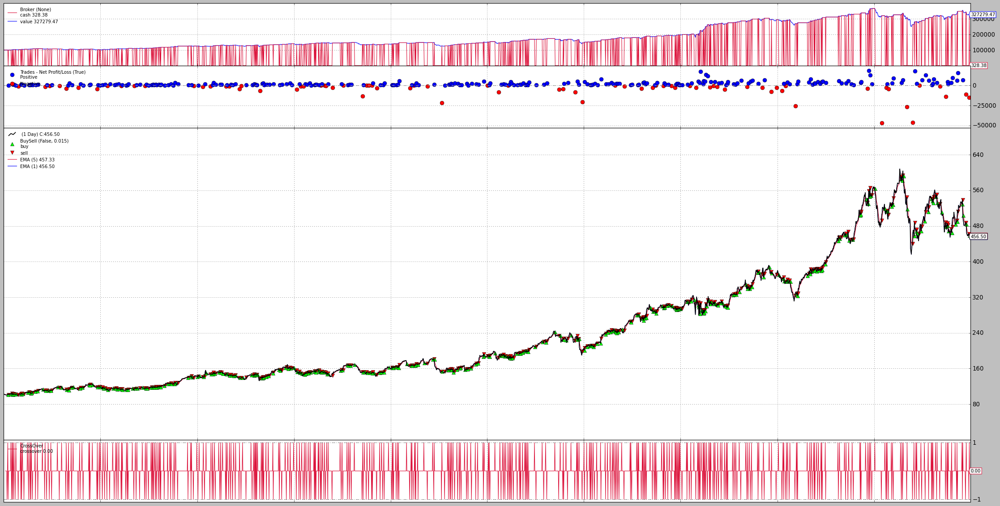

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,25,0.001,True,0,0,0,...,260,75,2352.835536,2.352836,-5107.004591,-5.107005,18090.843416,18.090843,-46634.422232,-46.634422


In [12]:
backtest("emac", df, fast_period=5, slow_period=1, single_position=True, fractional=25 )

In [13]:
#strategy define SMACStrategyNo233 & EMACStrategyNo233
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
# Import standard library
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy


class SMACStrategyNo233(BaseStrategy):
    """
    Simple moving average crossover strategy
    Parameters
    ----------
    fast_period : int
        The period used for the fast moving average line (should be smaller than `slow_upper`)
    slow_period : int
        The period used for the slow moving average line (should be larger than `fast_upper`)
    """

    params = (
        ("fast_period", 10),  # period for the fast moving average
        ("slow_period", 30),

    )

    def __init__(self):
        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.fast_period = self.params.fast_period
        self.slow_period = self.params.slow_period

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("fast_period :", self.fast_period)
            print("slow_period :", self.slow_period)
        sma_fast = bt.ind.SMA(period=self.fast_period)  # fast moving average
        sma_slow = bt.ind.SMA(period=self.slow_period)  # slow moving average
        self.crossover = bt.ind.CrossOver(sma_fast, sma_slow)  # crossover signal

    def buy_signal(self):
        return self.crossover > 0

    def sell_signal(self):
        return self.crossover < 0

class EMACStrategyNo233(BaseStrategy):
    """
    Simple moving average crossover strategy
    Parameters
    ----------
    fast_period : int
        The period used for the fast moving average line (should be smaller than `slow_upper`)
    slow_period : int
        The period used for the slow moving average line (should be larger than `fast_upper`)
    """

    params = (
        ("fast_period", 10),  # period for the fast moving average
        ("slow_period", 30),

    )

    def __init__(self):
        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.fast_period = self.params.fast_period
        self.slow_period = self.params.slow_period

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("fast_period :", self.fast_period)
            print("slow_period :", self.slow_period)
        ema_fast = bt.ind.SMA(period=self.fast_period)  # fast moving average
        ema_slow = bt.ind.SMA(period=self.slow_period)  # slow moving average
        self.crossover = bt.ind.CrossOver(ema_fast, ema_slow)  # crossover signal

    def buy_signal(self):
        return self.crossover > 0

    def sell_signal(self):
        return self.crossover < 0


In [14]:
# Creating SMACStrategy & EMACStrategy
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
# Import standard library
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy


class SMACStrategy(BaseStrategy):
    """
    Simple moving average crossover strategy
    Parameters
    ----------
    fast_period : int
        The period used for the fast moving average line (should be smaller than `slow_upper`)
    slow_period : int
        The period used for the slow moving average line (should be larger than `fast_upper`)
    """

    params = (
        ("fast_period", 10),  # period for the fast moving average
        ("slow_period", 30),
        ("veryslow_period", 233),
    )

    def __init__(self):
        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.fast_period = self.params.fast_period
        self.slow_period = self.params.slow_period
        self.veryslow_period = self.params.veryslow_period

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("fast_period :", self.fast_period)
            print("slow_period :", self.slow_period)
            print("veryslow_period :", self.veryslow_period)
        sma_fast = bt.ind.SMA(period=self.fast_period)  # fast moving average
        sma_slow = bt.ind.SMA(period=self.slow_period)  # slow moving average
        self.crossover = bt.ind.CrossOver(sma_fast, sma_slow)  # crossover signal
        self.sma_veryslow = bt.ind.SMA(period=self.veryslow_period)# veryslow EMA

    def buy_signal(self):
        return self.crossover > 0 and self.dataclose > self.sma_veryslow

    def sell_signal(self):
        return self.crossover < 0

class EMACStrategy(BaseStrategy):
    """
    Simple moving average crossover strategy
    Parameters
    ----------
    fast_period : int
        The period used for the fast moving average line (should be smaller than `slow_upper`)
    slow_period : int
        The period used for the slow moving average line (should be larger than `fast_upper`)
    """

    params = (
        ("fast_period", 10),  # period for the fast moving average
        ("slow_period", 30),
        ("veryslow_period", 233),
    )

    def __init__(self):
        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.fast_period = self.params.fast_period
        self.slow_period = self.params.slow_period
        self.veryslow_period = self.params.veryslow_period

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("fast_period :", self.fast_period)
            print("slow_period :", self.slow_period)
            print("veryslow_period :", self.veryslow_period)
        ema_fast = bt.ind.SMA(period=self.fast_period)  # fast moving average
        ema_slow = bt.ind.SMA(period=self.slow_period)  # slow moving average
        self.crossover = bt.ind.CrossOver(ema_fast, ema_slow)  # crossover signal
        self.ema_veryslow = bt.ind.EMA(period=self.veryslow_period)# veryslow EMA

    def buy_signal(self):
        return self.crossover > 0 and self.dataclose > self.ema_veryslow

    def sell_signal(self):
        return self.crossover < 0


In [15]:
df = yf.download("SPY", start="2013-01-01", end="2023-01-01")
res2 = backtest(SMACStrategy, df, fast_period=range(1, 30, 4), slow_period=range(1, 30, 4), verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 1
slow_period : 1
veryslow_period : 233
2022-12-30T00:00:00, Final Portfolio Value: 100000.0
2022-12-30T00:00:00, Final PnL: 0.0
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 1
slow_period : 5
veryslow_period : 233
2022-12-30T00:00:

In [16]:
print(res2[['fast_period', 'slow_period', 'win_rate', 'final_value', "maxdrawdown",  "sharperatio", "total"]].head(30))

    fast_period  slow_period  win_rate    final_value  maxdrawdown  \
0            29           17  0.794118  184680.394775    11.395891   
1            21           13  0.825000  181373.318253    11.049519   
2            25           13  0.828571  180118.655243    14.545296   
3            29           13  0.838710  179393.255951    13.070746   
4            29            1  0.855670  176812.621399    30.806614   
5            25            9  0.850000  172631.908951    28.750230   
6            29            9  0.828571  169111.256088    28.697999   
7            21            1  0.849558  164902.316071    30.789885   
8            29            5  0.833333  164247.605026    28.701655   
9             5            1  0.743802  162968.004898    12.241151   
10           17           13  0.733333  162868.751602    10.899875   
11           29           21  0.818182  161250.892456    12.116424   
12           21            9  0.790698  161002.302490    28.671406   
13            9     

Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 18
slow_period : 14
2022-12-30T00:00:00, Final Portfolio Value: 192630.4652709961
2022-12-30T00:00:00, Final PnL: 92630.47
Time used (seconds): 1.76851224899292
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['EMACStrategyNo233']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	shor

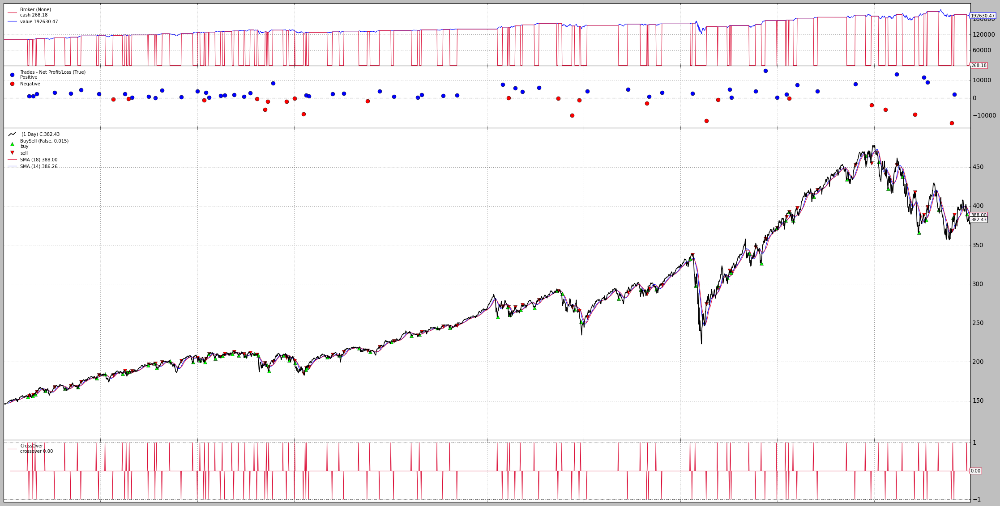

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,54,22,3387.865239,3.387865,-3940.575069,-3.940575,15243.478821,15.243479,-14033.676147,-14.033676


In [17]:
backtest(EMACStrategyNo233, df, fast_period=18, slow_period=14, single_position=True)

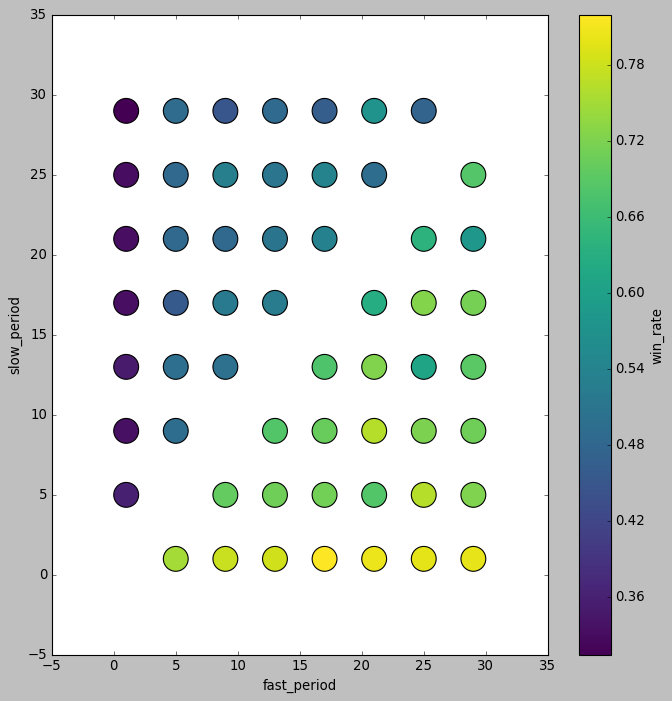

In [18]:
res.plot.scatter(x='fast_period',y='slow_period', c='win_rate', colormap='viridis', figsize=(10,10), s=500 )

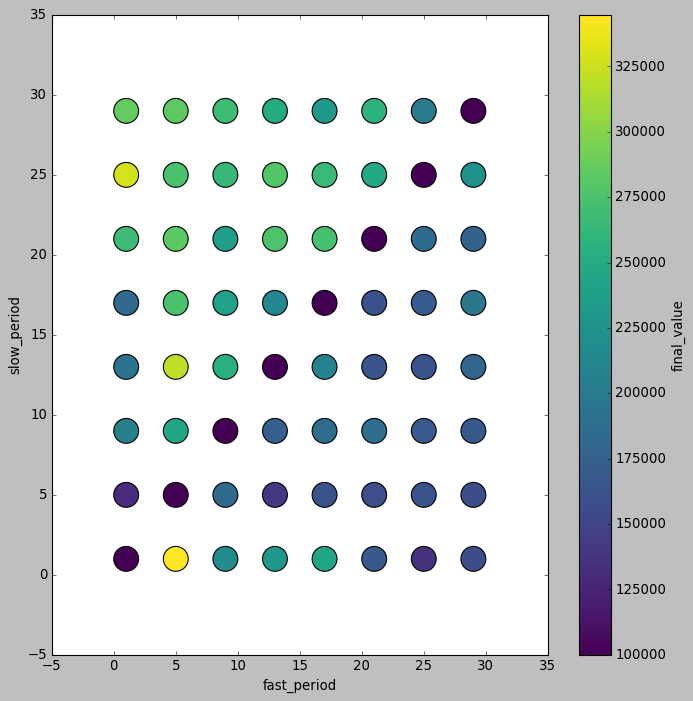

In [19]:
res.plot.scatter(x='fast_period',y='slow_period', c='final_value', colormap='viridis', figsize=(10,10), s=500 )

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2023-02-14T00:00:00, ===Global level arguments===
2023-02-14T00:00:00, init_cash : 100000
2023-02-14T00:00:00, buy_prop : 1
2023-02-14T00:00:00, sell_prop : 1
2023-02-14T00:00:00, commission : 0
2023-02-14T00:00:00, stop_loss : 0
2023-02-14T00:00:00, stop_trail : 0
2023-02-14T00:00:00, take_profit : 0
2023-02-14T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 30
slow_period : 15
veryslow_period : 233
2023-02-14T00:00:00, Final Portfolio Value: 217479.27394104004
2023-02-14T00:00:00, Final PnL: 117479.27
Time used (seconds): 4.375377893447876
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['EMACStrategy']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	al

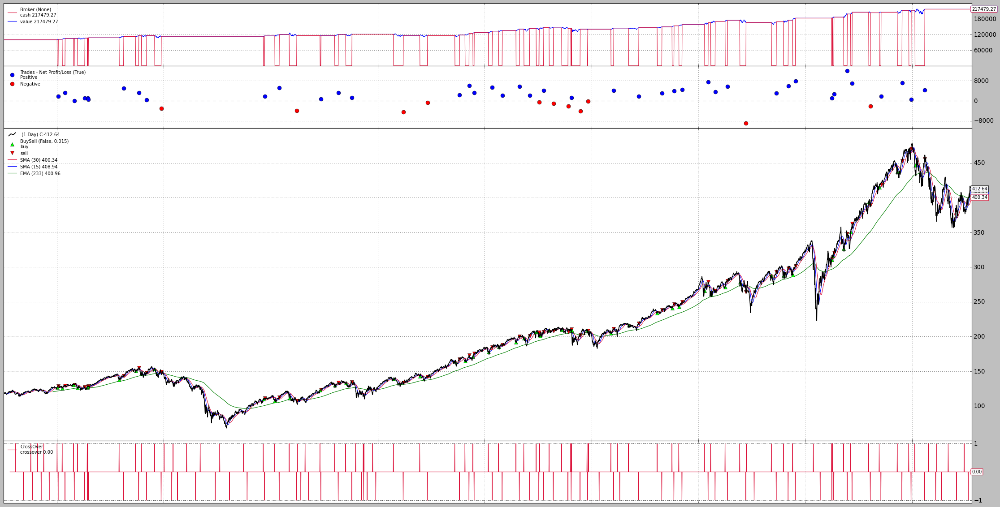

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,42,11,3546.639815,3.54664,-2861.781664,-2.861782,11947.195129,11.947195,-8905.0354,-8.905035


In [20]:
df = yf.download("SPY", start="2005-01-01", end="2023-02-15")
backtest(EMACStrategy, df, fast_period=30, slow_period=15, single_position=True)

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2023-02-14T00:00:00, ===Global level arguments===
2023-02-14T00:00:00, init_cash : 100000
2023-02-14T00:00:00, buy_prop : 1
2023-02-14T00:00:00, sell_prop : 1
2023-02-14T00:00:00, commission : 0
2023-02-14T00:00:00, stop_loss : 0
2023-02-14T00:00:00, stop_trail : 0
2023-02-14T00:00:00, take_profit : 0
2023-02-14T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 30
slow_period : 15
2023-02-14T00:00:00, Final Portfolio Value: 317005.13155555725
2023-02-14T00:00:00, Final PnL: 217005.13
Time used (seconds): 3.0879929065704346
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['emac']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	short_max:1.5

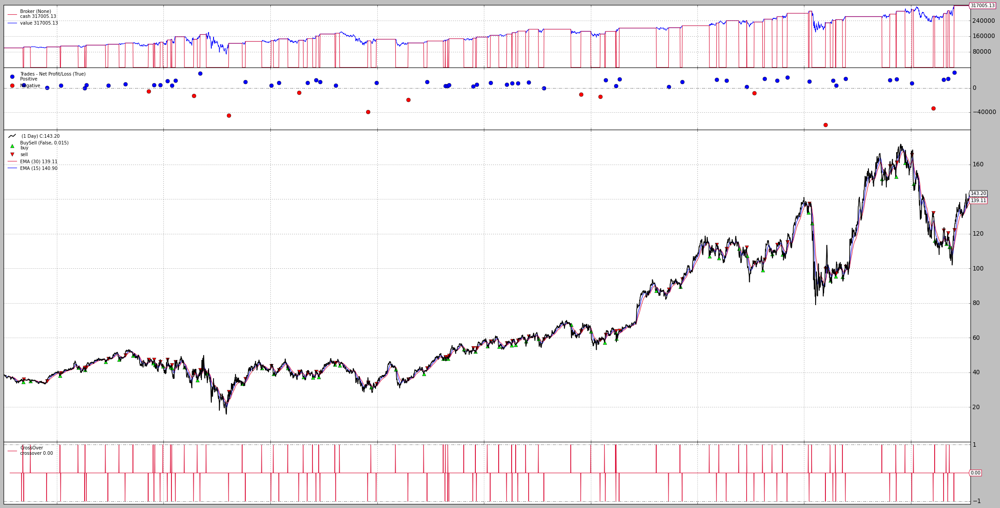

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,54,11,8770.011268,8.770011,-23325.043357,-23.325043,25236.354233,25.236354,-60376.80349,-60.376803


In [21]:
df = yf.download("JPM", start="2005-01-01", end="2023-02-15")
backtest("emac", df, fast_period=30, slow_period=15, single_position=True)

In [22]:
df = yf.download("SPY", start="2013-01-01", end="2023-02-15")
res = backtest("smac", df, fast_period=range(1, 30, 4), slow_period=range(1, 30, 4),verbose=True, plot=False, single_position=True)
print(res[['fast_period', 'slow_period', 'final_value', 'win_rate', "total"]].head())

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2023-02-14T00:00:00, ===Global level arguments===
2023-02-14T00:00:00, init_cash : 100000
2023-02-14T00:00:00, buy_prop : 1
2023-02-14T00:00:00, sell_prop : 1
2023-02-14T00:00:00, commission : 0
2023-02-14T00:00:00, stop_loss : 0
2023-02-14T00:00:00, stop_trail : 0
2023-02-14T00:00:00, take_profit : 0
2023-02-14T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 1
slow_period : 1
2023-02-14T00:00:00, Final Portfolio Value: 100000.0
2023-02-14T00:00:00, Final PnL: 0.0
2023-02-14T00:00:00, ===Global level arguments===
2023-02-14T00:00:00, init_cash : 100000
2023-02-14T00:00:00, buy_prop : 1
2023-02-14T00:00:00, sell_prop : 1
2023-02-14T00:00:00, commission : 0
2023-02-14T00:00:00, stop_loss : 0
2023-02-14T00:00:00, stop_trail : 0
2023-02-14T00:00:00, take_profit : 0
2023-02-14T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 1
slow_period : 5
2023-02-14T00:00:00, Final Portfolio Value: 118709.3003387451

In [23]:
print(res[['fast_period', 'slow_period', 'win_rate', 'final_value', "maxdrawdown", "total"]].head(50))

    fast_period  slow_period  win_rate    final_value  maxdrawdown  total
0             5            1  0.755882  237797.918488    29.502550    340
1             9            5  0.717105  223316.833572    30.796360    152
2            25           13  0.787234  211737.136215    28.671321     47
3            29           13  0.761905  210802.900116    28.706825     42
4             5           17  0.547619  204055.347122    19.268044     84
5             1           25  0.348837  188373.014618    14.382790    129
6            21           13  0.789474  184797.556107    28.680977     57
7             5           21  0.545455  183662.614227    20.103020     66
8            29            9  0.772727  182660.540176    28.669323     44
9            25           29  0.561404  179963.049927    18.009137     57
10            5           25  0.516667  177428.912003    17.062966     60
11           29            5  0.811321  176150.960358    28.660726     53
12           21            1  0.825503

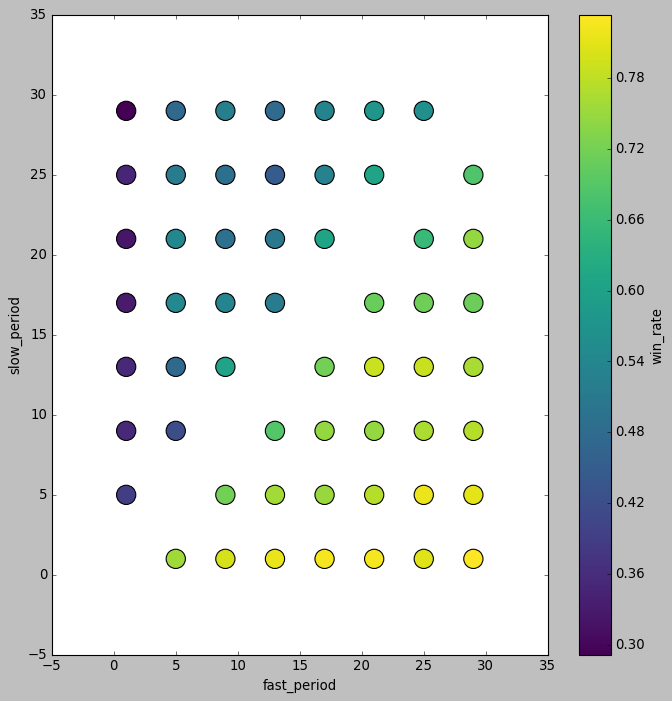

In [24]:
res.plot.scatter(x='fast_period',y='slow_period', c='win_rate', colormap='viridis', figsize=(10,10), s=300 )

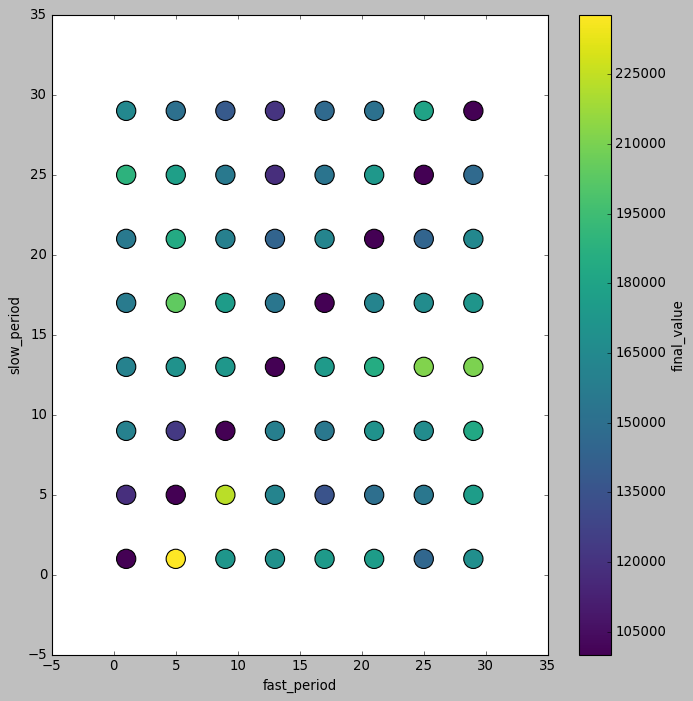

In [25]:
res.plot.scatter(x='fast_period',y='slow_period', c='final_value', colormap='viridis', figsize=(10,10), s=300 )

In [26]:
df = yf.download("BA", start="2005-01-01", end="2023-02-15")

[*********************100%%**********************]  1 of 1 completed


In [27]:
df = yf.download("SPY", start="2005-01-01", end="2023-01-01")
res = backtest("rsi", df, rsi_period=range(2, 3, 1), rsi_upper=range(35, 96, 5), rsi_lower=range(5, 10, 5), verbose=True, plot=False, single_position=True )

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
rsi_period : 2
rsi_upper : 35
rsi_lower : 5
2022-12-30T00:00:00, Final Portfolio Value: 141845.4326095581
2022-12-30T00:00:00, Final PnL: 41845.43
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
rsi_period : 2
rsi_upper : 40
rsi_lower : 5
2022-12-30T00:00:00, Fi

In [28]:
print(res[['rsi_period', 'rsi_upper', 'rsi_lower', 'win_rate', "final_value", "maxdrawdown", "sharperatio", "total"]].head(50))

    rsi_period  rsi_upper  rsi_lower  win_rate    final_value  maxdrawdown  \
0            2         95          5  0.756757  229444.562172    42.825839   
1            2         90          5  0.787234  213881.633766    38.655326   
2            2         70          5  0.775701  170336.116913    17.195938   
3            2         85          5  0.777778  167280.014961    35.264251   
4            2         75          5  0.792453  165348.266228    30.884216   
5            2         65          5  0.761468  165264.178795    17.445268   
6            2         50          5  0.792793  161567.138771    15.469472   
7            2         60          5  0.763636  160096.433144    15.463281   
8            2         55          5  0.763636  155227.454071    15.472469   
9            2         80          5  0.778846  150574.316452    34.898936   
10           2         45          5  0.792793  144241.112061    15.462434   
11           2         35          5  0.805310  141845.432610   

Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
rsi_period : 2
rsi_upper : 50
rsi_lower : 35
2022-12-30T00:00:00, Final Portfolio Value: 496234.2070083618
2022-12-30T00:00:00, Final PnL: 396234.21
Time used (seconds): 4.617077589035034
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['rsi']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:None	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	short

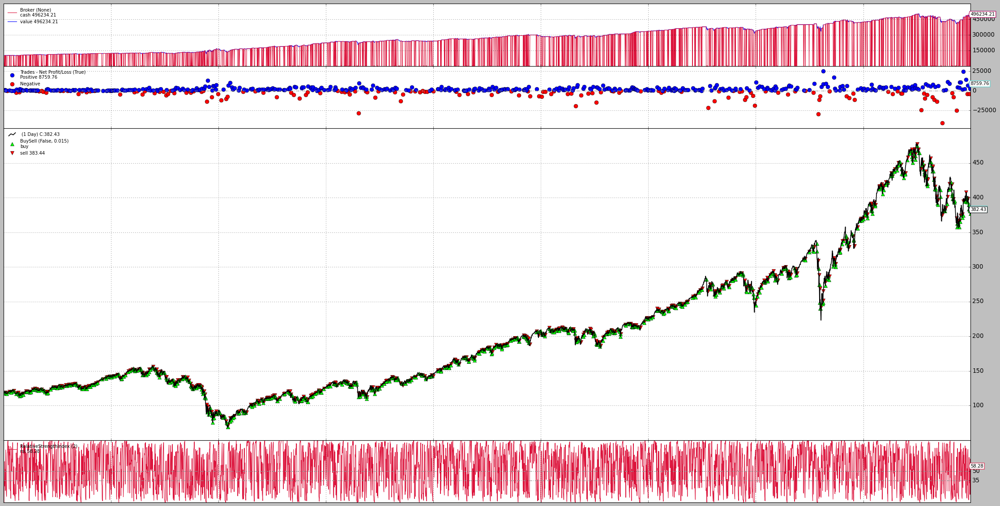

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,None,0,0,0,...,430,149,2556.25941,2.556259,-4717.834491,-4.717834,24888.284485,24.888284,-41273.513031,-41.273513


In [29]:
backtest('rsi', df, rsi_period=2, rsi_upper=50, rsi_lower=35)

In [30]:
#df = yf.download("SPY", start="2013-01-01", end="2023-02-15")
#res = backtest("smac", df, fast_period=range(1, 30, 4), slow_period=range(1, 30, 4),verbose=True, plot=False, single_position=True)
#print(res[['fast_period', 'slow_period', 'final_value', 'win_rate', "total"]].head())

In [31]:
#print(res[['rsi_period', 'rsi_upper', 'rsi_lower', 'win_rate', "final_value", "maxdrawdown", "sharperatio", "total"]].head(50))

Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
rsi_period : 2
rsi_upper : 75
rsi_lower : 25
2022-12-30T00:00:00, Final Portfolio Value: 450943.4418411255
2022-12-30T00:00:00, Final PnL: 350943.44
Time used (seconds): 3.3988919258117676
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['rsi']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	shor

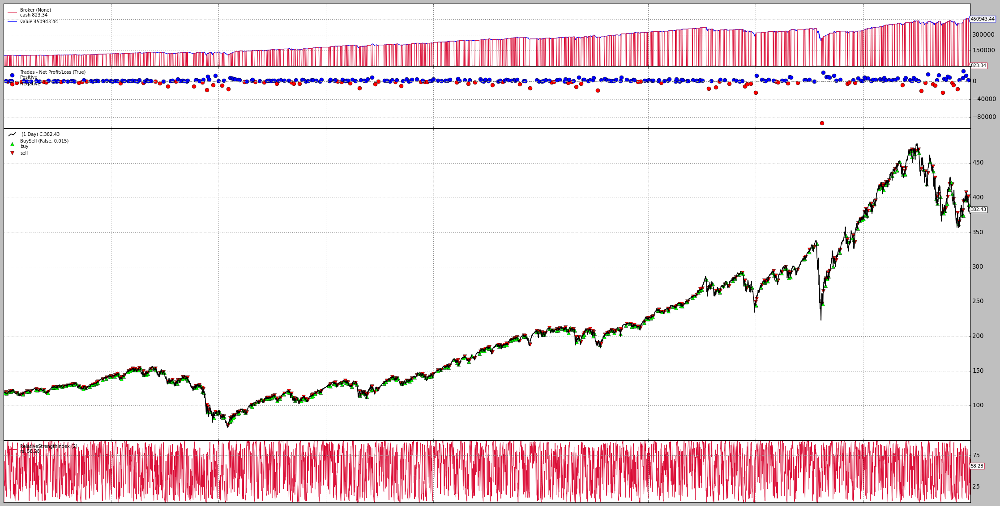

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,266,81,3347.31673,3.347317,-6555.165359,-6.555165,23068.317261,23.068317,-93278.459045,-93.278459


In [32]:
backtest('rsi', df, rsi_period=2, rsi_upper=75, rsi_lower=25, single_position=True)

Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
rsi_period : 4
rsi_upper : 55
rsi_lower : 25
2022-12-30T00:00:00, Final Portfolio Value: 291149.29022979736
2022-12-30T00:00:00, Final PnL: 191149.29
Time used (seconds): 3.098559856414795
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['rsi']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	shor

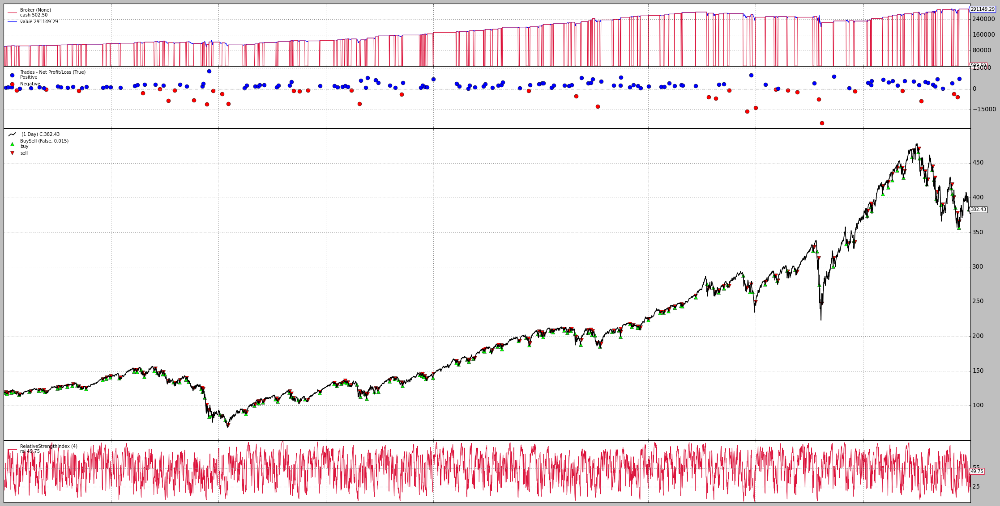

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,123,36,3084.494814,3.084495,-5211.254851,-5.211255,12860.916801,12.860917,-24641.135895,-24.641136


In [33]:
backtest('rsi', df, rsi_period=4, rsi_upper=55, rsi_lower=25, single_position=True)

In [34]:
#RSIStrategy
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy

class RSIStrategy(BaseStrategy):
    """
    Relative Strength Index (RSI) trading strategy
    Parameters
    ----------
    rsi_period : int
        Period used as basis in computing RSI
    rsi_upper : int
        The RSI upper limit, above which the assess is considered "overbought" and is sold
    rsi_lower : int
        The RSI lower limit, below which the assess is considered "oversold" and is bought
    ema_long:int
    """

    params = (("rsi_period", 14), ("rsi_upper", 70), ("rsi_lower", 30), ("slow_period", 233))

    def __init__(self):

        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.rsi_period = self.params.rsi_period
        self.rsi_upper = self.params.rsi_upper
        self.rsi_lower = self.params.rsi_lower
        self.slow_period = self.params.slow_period

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("rsi_period :", self.rsi_period)
            print("rsi_upper :", self.rsi_upper)
            print("rsi_lower :", self.rsi_lower)
            print("slow_period :", self.slow_period)
        self.ema_slow = bt.ind.EMA(period=self.slow_period)
        self.rsi = bt.indicators.RelativeStrengthIndex(
            period=self.rsi_period,
            upperband=self.rsi_upper,
            lowerband=self.rsi_lower,

        )

    def buy_signal(self):
        return (self.rsi[0] < self.rsi_lower) and (self.dataclose > self.ema_slow)

    def sell_signal(self):
        return self.rsi[0] > self.rsi_upper



In [35]:
#RSIStrategyAbove
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy

class RSIStrategyAbove(BaseStrategy):
    """
    Relative Strength Index (RSI) trading strategy
    Parameters
    ----------
    rsi_period : int
        Period used as basis in computing RSI
    rsi_upper : int
        The RSI upper limit, above which the assess is considered "overbought" and is sold
    rsi_lower : int
        The RSI lower limit, below which the assess is considered "oversold" and is bought
    ema_long:int
    """

    params = (("rsi_period", 14), ("rsi_upper", 70), ("rsi_lower", 30), ("slow_period", 233))

    def __init__(self):

        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.rsi_period = self.params.rsi_period
        self.rsi_upper = self.params.rsi_upper
        self.rsi_lower = self.params.rsi_lower
        self.slow_period = self.params.slow_period

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("rsi_period :", self.rsi_period)
            print("rsi_upper :", self.rsi_upper)
            print("rsi_lower :", self.rsi_lower)
            print("slow_period :", self.slow_period)
        self.ema_slow = bt.ind.EMA(period=self.slow_period)
        self.rsi = bt.indicators.RelativeStrengthIndex(
            period=self.rsi_period,
            upperband=self.rsi_upper,
            lowerband=self.rsi_lower,

        )

    def buy_signal(self):
        return (self.rsi > self.rsi_upper) and (self.dataclose > self.ema_slow)

    def sell_signal(self):
        return self.rsi < self.rsi_upper



In [36]:
#print(res2[['cci_period', 'cci_upper',"cci_lower" ,'win_rate', "final_value", "maxdrawdown", "total"]].head(60))

In [37]:
df = yf.download("KO", start="2022-07-07", end="2023-07-07", interval="1h")
res2 = backtest(RSIStrategyAbove, df, rsi_period=range(2, 4, 1), rsi_upper=range(45, 95, 5), rsi_lower=range(1,25,5), verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2023-07-06T19:30:00, ===Global level arguments===
2023-07-06T19:30:00, init_cash : 100000
2023-07-06T19:30:00, buy_prop : 1
2023-07-06T19:30:00, sell_prop : 1
2023-07-06T19:30:00, commission : 0
2023-07-06T19:30:00, stop_loss : 0
2023-07-06T19:30:00, stop_trail : 0
2023-07-06T19:30:00, take_profit : 0
2023-07-06T19:30:00, allow_short : False
===Strategy level arguments===
rsi_period : 2
rsi_upper : 45
rsi_lower : 1
slow_period : 233
2023-07-06T19:30:00, Final Portfolio Value: 100332.4404220581
2023-07-06T19:30:00, Final PnL: 332.44
2023-07-06T19:30:00, ===Global level arguments===
2023-07-06T19:30:00, init_cash : 100000
2023-07-06T19:30:00, buy_prop : 1
2023-07-06T19:30:00, sell_prop : 1
2023-07-06T19:30:00, commission : 0
2023-07-06T19:30:00, stop_loss : 0
2023-07-06T19:30:00, stop_trail : 0
2023-07-06T19:30:00, take_profit : 0
2023-07-06T19:30:00, allow_short : False
===Strategy level arguments===
rsi_period : 2
rsi_upper : 45
rsi_lower : 6
slow_pe

In [38]:
print(res2[['rsi_period', "rsi_lower", 'rsi_upper',  'win_rate', "final_value", "maxdrawdown", "total"]].head(60))

    rsi_period  rsi_lower  rsi_upper  win_rate    final_value  maxdrawdown  \
0            3         21         45  0.303371  100607.795746     7.245697   
1            3         16         45  0.303371  100607.795746     7.245697   
2            3         11         45  0.303371  100607.795746     7.245697   
3            3          6         45  0.303371  100607.795746     7.245697   
4            3          1         45  0.303371  100607.795746     7.245697   
5            2          1         45  0.341880  100332.440422     6.986447   
6            2          6         45  0.341880  100332.440422     6.986447   
7            2         11         45  0.341880  100332.440422     6.986447   
8            2         16         45  0.341880  100332.440422     6.986447   
9            2         21         45  0.341880  100332.440422     6.986447   
10           3         16         70  0.333333   99583.948322     5.737954   
11           3          1         70  0.333333   99583.948322   

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
rsi_period : 6
rsi_upper : 80
rsi_lower : 20
slow_period : 233
2022-12-30T00:00:00, Final Portfolio Value: 95959.64818191528
2022-12-30T00:00:00, Final PnL: -4040.35
Time used (seconds): 0.5360696315765381
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['RSIStrategyAbove']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	

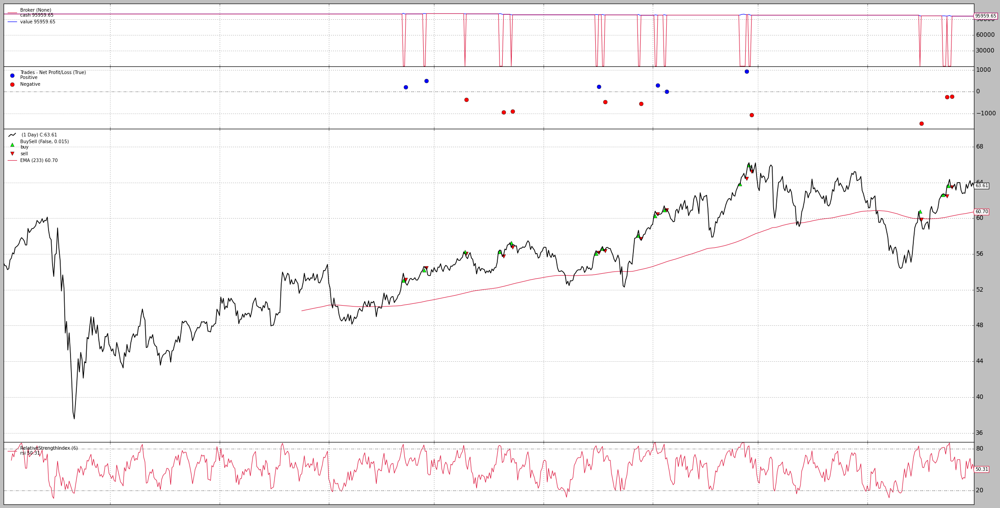

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,6,9,360.101434,0.360101,-688.995603,-0.688996,935.130936,0.935131,-1464.189754,-1.46419


In [39]:
df = yf.download("ko", start="2020-01-01", end="2023-01-01")
backtest(RSIStrategyAbove, df, rsi_period=6, rsi_upper=80, rsi_lower=20, single_position=True)

Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
rsi_period : 2
rsi_upper : 70
rsi_lower : 10
slow_period : 233
2022-12-30T00:00:00, Final Portfolio Value: 100789.59689331055
2022-12-30T00:00:00, Final PnL: 789.6
Time used (seconds): 0.8375153541564941
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['RSIStrategy']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:

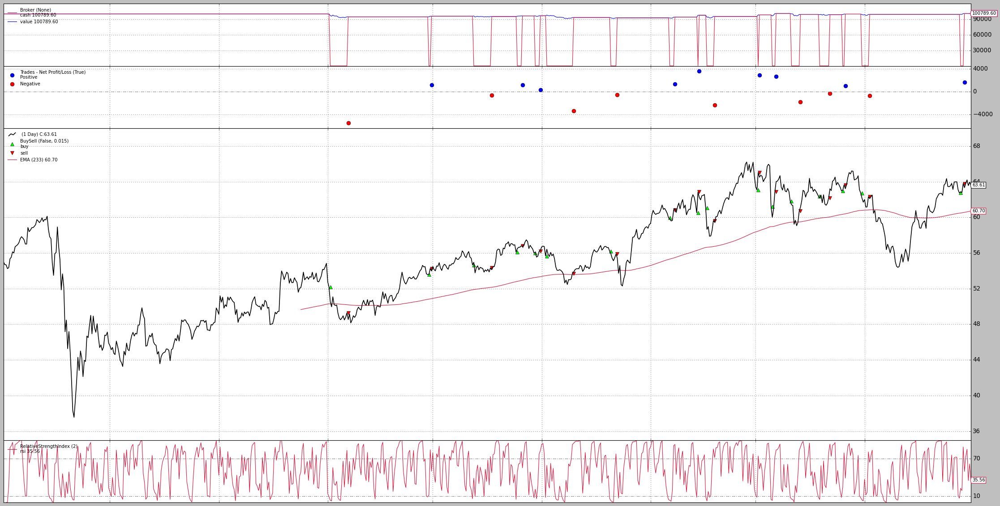

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,9,8,1775.472758,1.775473,-1898.707242,-1.898707,3627.000237,3.627,-5531.458832,-5.531459


In [40]:
backtest(RSIStrategy, df, rsi_period=2, rsi_upper=70, rsi_lower=10, slow_period=233, single_position=True)

In [41]:
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy

class PriceAboveEMA(BaseStrategy):
    """
    fast_period : int
        Fast period moving average
    slow_period : int
        Slow period moving average
    """

    params = ( ("fast_period", 8), ("slow_period", 233),  ("middle_period", 55),)

    def __init__(self):

        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.slow_period = self.params.slow_period
        self.fast_period = self.params.fast_period
        self.middle_period = self.params.middle_period

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("fast_period :", self.fast_period)
            print("slow_period :", self.slow_period)
            print("middle_period :", self.middle_period)

        self.ema_fast = bt.ind.EMA(period=self.fast_period)
        self.ema_slow = bt.ind.EMA(period=self.slow_period)
        self.middle_slow = bt.ind.EMA(period=self.middle_period)


    def buy_signal(self):
        return  (self.dataclose > self.ema_slow) and (self.dataclose < self.ema_fast) and (self.dataclose[0] > self.middle_slow)

    def sell_signal(self):
        return (self.dataclose > self.ema_fast)


In [42]:
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy

class PriceAboveSMA(BaseStrategy):
    """
    fast_period : int
        Fast period moving average
    slow_period : int
        Slow period moving average
    """

    params = ( ("fast_period", 8), ("slow_period", 233))

    def __init__(self):

        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.slow_period = self.params.slow_period
        self.fast_period = self.params.fast_period
        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("fast_period :", self.fast_period)
            print("slow_period :", self.slow_period)
        self.sma_fast = bt.ind.SMA(period=self.fast_period)
        self.ema_slow = bt.ind.EMA(period=self.slow_period)

    def buy_signal(self):
        return  (self.dataclose > self.ema_slow) and (self.dataclose < self.sma_fast)

    def sell_signal(self):
        return (self.dataclose > self.sma_fast)


In [43]:
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy

class SMAUpDown(BaseStrategy):
    """
    fast_period : int
        Fast period moving average
    slow_period : int
        Slow period moving average
    """

    params = ( ("fast_period", 8), )

    def __init__(self):

        # Initialize global variables
        super().__init__()
        # Strategy level variables

        self.fast_period = self.params.fast_period
        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("fast_period :", self.fast_period)

        self.sma_fast = bt.ind.SMA(period=self.fast_period)


    def buy_signal(self):
        return  (self.sma_fast[1] < self.sma_fast)

    def sell_signal(self):
        return (self.sma_fast[1] > self.sma_fast)


In [44]:
df = yf.download("SPY", start="2022-02-02", end="2023-09-09")
res = backtest(PriceAboveSMA, df, fast_period = range(1,22,1), verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2023-09-08T00:00:00, ===Global level arguments===
2023-09-08T00:00:00, init_cash : 100000
2023-09-08T00:00:00, buy_prop : 1
2023-09-08T00:00:00, sell_prop : 1
2023-09-08T00:00:00, commission : 0
2023-09-08T00:00:00, stop_loss : 0
2023-09-08T00:00:00, stop_trail : 0
2023-09-08T00:00:00, take_profit : 0
2023-09-08T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 1
slow_period : 233
2023-09-08T00:00:00, Final Portfolio Value: 100000.0
2023-09-08T00:00:00, Final PnL: 0.0
2023-09-08T00:00:00, ===Global level arguments===
2023-09-08T00:00:00, init_cash : 100000
2023-09-08T00:00:00, buy_prop : 1
2023-09-08T00:00:00, sell_prop : 1
2023-09-08T00:00:00, commission : 0
2023-09-08T00:00:00, stop_loss : 0
2023-09-08T00:00:00, stop_trail : 0
2023-09-08T00:00:00, take_profit : 0
2023-09-08T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 2
slow_period : 233
2023-09-08T00:00:00, Final Portfolio Value: 103909.447509

In [45]:
print(res[["fast_period", 'win_rate',"final_value","maxdrawdown","total"]].head(60))

    fast_period  win_rate    final_value  maxdrawdown  total
0             9  0.823529  110972.784210     3.311355     17
1            10  0.727273  107221.902954     3.311355     11
2             4  0.761905  106975.999939     3.310588     21
3             8  0.800000  106265.361145     3.311355     15
4            11  0.750000  106226.107544     3.311355     12
5             5  0.736842  105335.545441     3.310588     19
6             6  0.750000  104838.724457     3.299822     16
7            12  0.727273  104727.889008     3.311355     11
8             7  0.785714  104553.474548     3.299822     14
9            18  0.750000  104537.654572     3.303762      8
10           17  0.750000  104469.334869     3.303762      8
11            2  0.687500  103909.447510     2.813649     32
12            3  0.666667  103869.769409     2.864116     24
13           13  0.750000  103521.033386     3.311355      8
14           16  0.750000  102984.536285     3.303762      8
15           15  0.75000

Starting Portfolio Value: 100000.00
2023-09-08T00:00:00, ===Global level arguments===
2023-09-08T00:00:00, init_cash : 100000
2023-09-08T00:00:00, buy_prop : 1
2023-09-08T00:00:00, sell_prop : 1
2023-09-08T00:00:00, commission : 0
2023-09-08T00:00:00, stop_loss : 0
2023-09-08T00:00:00, stop_trail : 0
2023-09-08T00:00:00, take_profit : 0
2023-09-08T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 11
slow_period : 233
2023-09-08T00:00:00, Final Portfolio Value: 106226.10754394531
2023-09-08T00:00:00, Final PnL: 6226.11
Time used (seconds): 0.2796945571899414
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['PriceAboveSMA']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	short

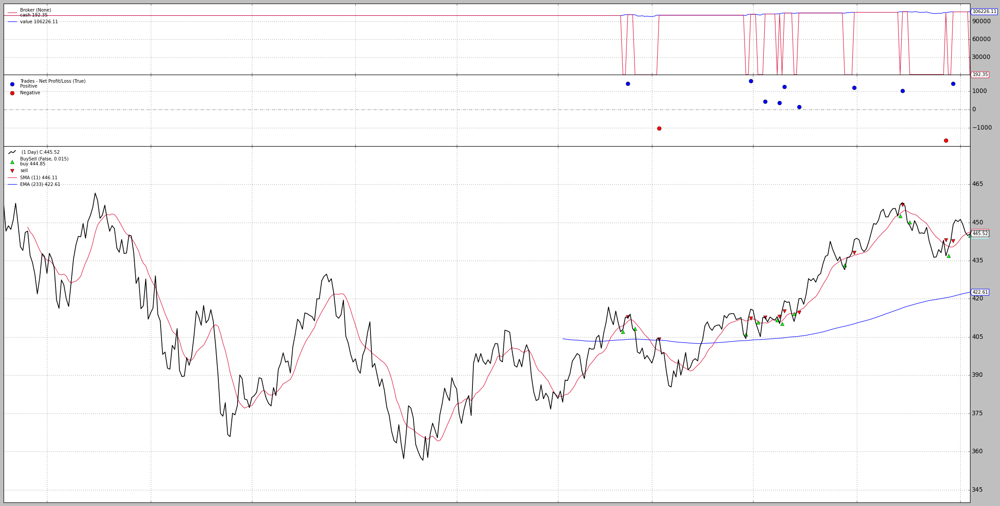

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,9,2,972.163571,0.972164,-1341.410263,-1.34141,1557.184204,1.557184,-1668.501434,-1.668501


In [46]:
backtest(PriceAboveSMA, df, fast_period=11,  single_position=True)

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2023-03-30T00:00:00, ===Global level arguments===
2023-03-30T00:00:00, init_cash : 100000
2023-03-30T00:00:00, buy_prop : 1
2023-03-30T00:00:00, sell_prop : 1
2023-03-30T00:00:00, commission : 0
2023-03-30T00:00:00, stop_loss : 0
2023-03-30T00:00:00, stop_trail : 0
2023-03-30T00:00:00, take_profit : 0
2023-03-30T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 21
2023-03-30T00:00:00, Final Portfolio Value: 66519.22787475586
2023-03-30T00:00:00, Final PnL: -33480.77
Time used (seconds): 0.44691991806030273
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['SMAUpDown']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	short_max:1.5	add_cash_am

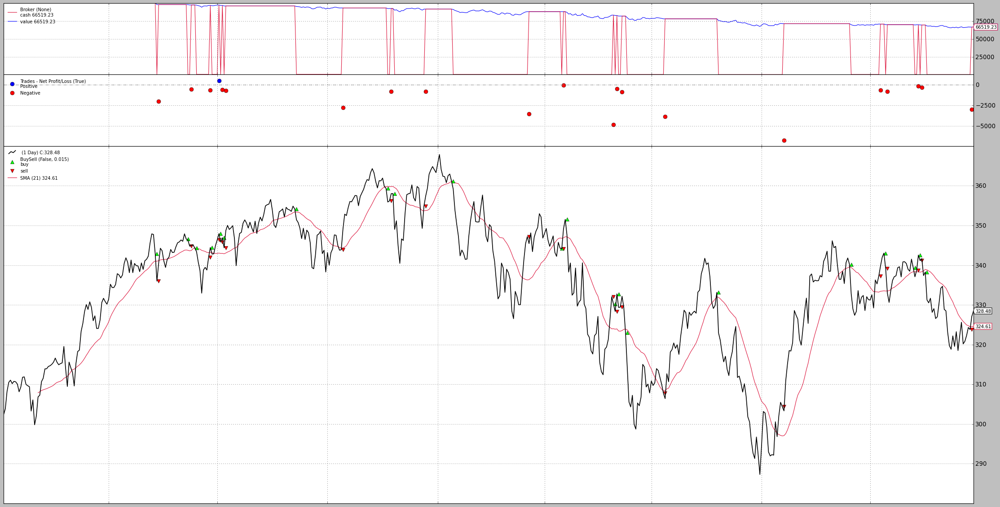

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,1,20,534.79248,0.534792,-1700.77823,-1.700778,534.79248,0.534792,-6739.197144,-6.739197


In [47]:
df = yf.download("DIA", start="2021-01-01", end="2023-03-31")
backtest(SMAUpDown, df, fast_period=21,  single_position=True)

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
fast_period : 8
slow_period : 233
middle_period : 80
2022-12-30T00:00:00, Final Portfolio Value: 262988.3486404419
2022-12-30T00:00:00, Final PnL: 162988.35
Time used (seconds): 5.042330026626587
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['PriceAboveEMA']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow

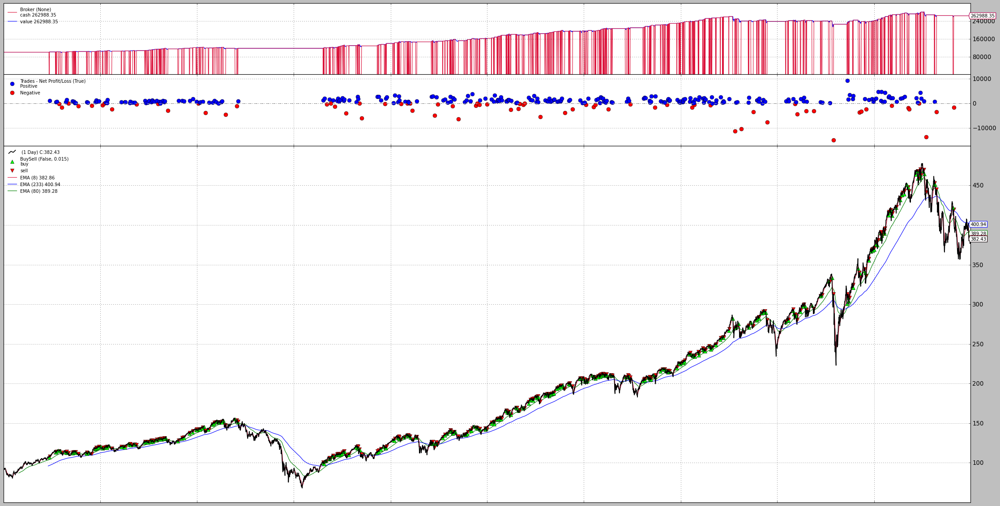

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,263,71,1269.508424,1.269508,-2406.934746,-2.406935,9237.804565,9.237805,-14805.178406,-14.805178


In [48]:
df = yf.download("SPY", start="2003-01-01", end="2023-01-01")
backtest(PriceAboveEMA, df,fast_period = 8,middle_period=80,  slow_period=233, single_position=True)

Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
2022-12-30T00:00:00, Final Portfolio Value: 420437.5230102539
2022-12-30T00:00:00, Final PnL: 320437.52
Time used (seconds): 3.2556869983673096
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['buynhold']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	short_max:1.5	add_cash_amount:0	add_cash_freq:M	invest_div:True
Returns	rto

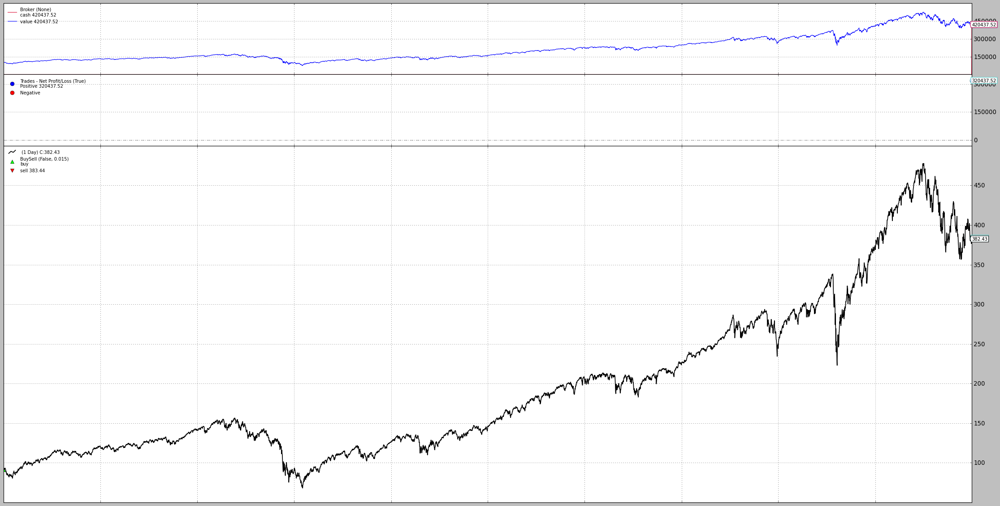

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,1,0,320437.52301,320.437523,0.0,0.0,320437.52301,320.437523,0.0,0.0


In [49]:
backtest("buynhold", df, single_position=True)

In [52]:
#print(res[['rsi_period', 'rsi_upper', 'rsi_lower', 'win_rate', "final_value", "maxdrawdown", "total"]].head(50))

Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
rsi_period : 3
rsi_upper : 55
rsi_lower : 10
slow_period : 233
2022-12-30T00:00:00, Final Portfolio Value: 141904.37160491943
2022-12-30T00:00:00, Final PnL: 41904.37
Time used (seconds): 3.280189037322998
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['RSIStrategy']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:True	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbo

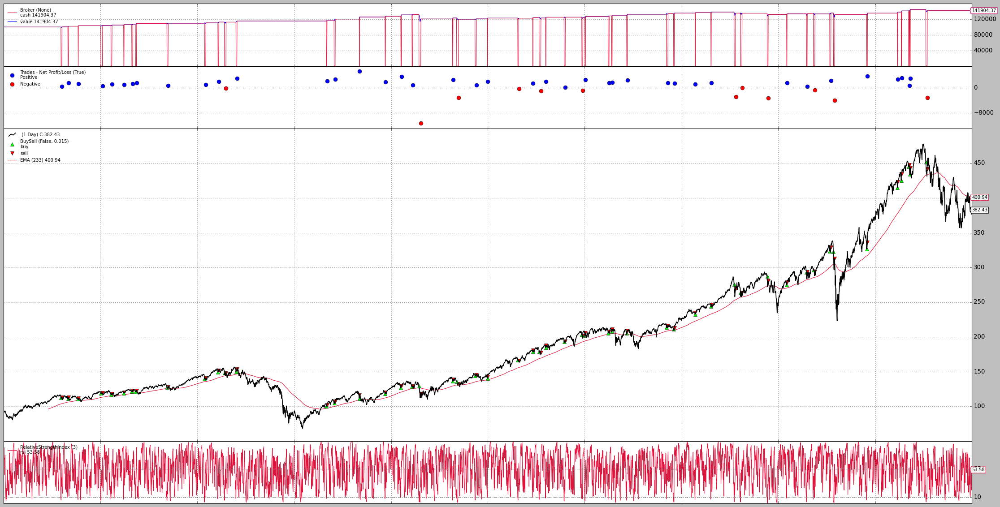

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,True,0,0,0,...,40,12,1820.896378,1.820896,-2577.623625,-2.577624,5292.001648,5.292002,-11422.989067,-11.422989


In [53]:
backtest(RSIStrategy, df, rsi_period=3, rsi_upper=55, rsi_lower=10, slow_period=233, single_position=True)

In [58]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
# Import standard library
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy


class BBandsStrategy(BaseStrategy):
    """
    Bollinger Bands strategy
    Simple implementation of backtrader BBands strategy reference: https://community.backtrader.com/topic/122/bband-strategy/2
    Parameters
    ----------
    period : int
        Period used as basis in calculating the moving average and standard deviation
    devfactor : float
        The number of standard deviations from the moving average to derive the upper and lower bands
    TODO: Study this strategy closer based on the above reference. Current implementation is naive.
    """

    params = (
        ("period", 20),  # period for the fast moving average
        ("devfactor", 2.1),
    )

    def __init__(self):
        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.period = self.params.period
        self.devfactor = float(self.params.devfactor)

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("period :", self.period)
            print("devfactor :", self.devfactor)
        bbands = bt.ind.BBands(period=self.period, devfactor=float(self.devfactor))
        self.mid = bbands.mid
        self.top = bbands.top
        self.bot = bbands.bot

    def buy_signal(self):
        return self.dataclose[0] < self.bot

    def sell_signal(self):
        return self.dataclose[0] > self.mid

In [59]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
# Import standard library
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy


class BBandsStrategyEMA233(BaseStrategy):

    params = (
        ("period", 20),  # period for the fast moving average
        ("devfactor", 2.1),
        ("long_moving", 233),
    )

    def __init__(self):
        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.period = self.params.period
        self.devfactor = float(self.params.devfactor)
        self.long_moving = self.params.long_moving
        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("period :", self.period)
            print("devfactor :", float(self.devfactor))
            print("long_moving:", self.long_moving)
        bbands = bt.ind.BBands(period=self.period, devfactor=float(self.devfactor))
        self.moving233 = bt.ind.EMA(period=self.long_moving)
        self.mid = bbands.mid
        self.top = bbands.top
        self.bot = bbands.bot

    def buy_signal(self):
        return self.dataclose[0] < self.bot and self.dataclose[0] > self.moving233

    def sell_signal(self):
        return self.dataclose[0] > self.mid

In [56]:
import numpy as np

In [61]:
df = yf.download("XLE", start="2023-01-15", end="2023-04-01",interval="1h")
res = backtest(BBandsStrategy, df, period = range(1,11,1), devfactor=np.arange(1,4,0.1), verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed


Streaming output truncated to the last 5000 lines.
2023-03-31T19:30:00, stop_loss : 0
2023-03-31T19:30:00, stop_trail : 0
2023-03-31T19:30:00, take_profit : 0
2023-03-31T19:30:00, allow_short : False
===Strategy level arguments===
period : 4
devfactor : 1.3000000000000003
2023-03-31T19:30:00, Final Portfolio Value: 110237.3129272461
2023-03-31T19:30:00, Final PnL: 10237.31
2023-03-31T19:30:00, ===Global level arguments===
2023-03-31T19:30:00, init_cash : 100000
2023-03-31T19:30:00, buy_prop : 1
2023-03-31T19:30:00, sell_prop : 1
2023-03-31T19:30:00, commission : 0
2023-03-31T19:30:00, stop_loss : 0
2023-03-31T19:30:00, stop_trail : 0
2023-03-31T19:30:00, take_profit : 0
2023-03-31T19:30:00, allow_short : False
===Strategy level arguments===
period : 4
devfactor : 1.4000000000000004
2023-03-31T19:30:00, Final Portfolio Value: 116688.75844573975
2023-03-31T19:30:00, Final PnL: 16688.76
2023-03-31T19:30:00, ===Global level arguments===
2023-03-31T19:30:00, init_cash : 100000
2023-03-31T19

In [62]:
df = yf.download("KO", start="2005-01-15", end="2023-04-01")
res = backtest(BBandsStrategyEMA233, df, period = range(1,11,1), devfactor=np.arange(1,4,0.1), verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed


Streaming output truncated to the last 5000 lines.
2023-03-31T00:00:00, buy_prop : 1
2023-03-31T00:00:00, sell_prop : 1
2023-03-31T00:00:00, commission : 0
2023-03-31T00:00:00, stop_loss : 0
2023-03-31T00:00:00, stop_trail : 0
2023-03-31T00:00:00, take_profit : 0
2023-03-31T00:00:00, allow_short : False
===Strategy level arguments===
period : 4
devfactor : 2.7000000000000015
long_moving: 233
2023-03-31T00:00:00, Final Portfolio Value: 100000.0
2023-03-31T00:00:00, Final PnL: 0.0
2023-03-31T00:00:00, ===Global level arguments===
2023-03-31T00:00:00, init_cash : 100000
2023-03-31T00:00:00, buy_prop : 1
2023-03-31T00:00:00, sell_prop : 1
2023-03-31T00:00:00, commission : 0
2023-03-31T00:00:00, stop_loss : 0
2023-03-31T00:00:00, stop_trail : 0
2023-03-31T00:00:00, take_profit : 0
2023-03-31T00:00:00, allow_short : False
===Strategy level arguments===
period : 4
devfactor : 2.8000000000000016
long_moving: 233
2023-03-31T00:00:00, Final Portfolio Value: 100000.0
2023-03-31T00:00:00, Final Pn

In [63]:
print(res[['period', 'devfactor', 'win_rate', "final_value", "maxdrawdown", "total"]].head(60))

    period  devfactor  win_rate    final_value  maxdrawdown  total
0        8        1.1  0.751220  269820.363401    16.288885    205
1        7        1.0  0.748918  262390.650927    18.543349    231
2        5        1.2  0.703704  257340.695932    13.270826    270
3        8        1.0  0.750000  255981.866341    16.446590    212
4        6        1.1  0.727642  252512.459534    12.547477    246
5        6        1.0  0.720930  250934.860628    12.298268    258
6        5        1.1  0.710801  246755.276667    13.092957    287
7        5        1.3  0.712551  246670.886263    11.292353    247
8       10        1.1  0.722543  246282.847561    14.362357    173
9        7        1.1  0.739535  242315.933558    17.773011    215
10       9        1.0  0.743455  241554.531088    15.078749    191
11       8        1.2  0.746032  240575.752659    17.801389    189
12      10        1.0  0.717514  237254.722084    14.362884    177
13       5        1.4  0.713656  233937.651686    10.211015   

In [64]:
import numpy as np

In [65]:
df = yf.download("SPY", start="2005-01-01", end="2023-01-01")
res = backtest(BBandsStrategyEMA233, df, period = range(1,11,1), devfactor=np.arange(0.1,4,0.1),long_moving=(233), verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed

Starting Portfolio Value: 100000.00


Streaming output truncated to the last 5000 lines.
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
period : 7
devfactor : 0.6
long_moving: 233
2022-12-30T00:00:00, Final Portfolio Value: 278639.2608947754
2022-12-30T00:00:00, Final PnL: 178639.26
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
period : 7
devfactor : 0.7000000000000001
long_moving: 233
2022-12-30T00:00:00, Final Portfolio Value: 259622.02294158936
2022-12-30T00:00:00

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2023-03-28T19:30:00, ===Global level arguments===
2023-03-28T19:30:00, init_cash : 100000
2023-03-28T19:30:00, buy_prop : 1
2023-03-28T19:30:00, sell_prop : 1
2023-03-28T19:30:00, commission : 0
2023-03-28T19:30:00, stop_loss : 0
2023-03-28T19:30:00, stop_trail : 0
2023-03-28T19:30:00, take_profit : 0
2023-03-28T19:30:00, allow_short : False
===Strategy level arguments===
period : 10
devfactor : 1.0
long_moving: 233
2023-03-28T19:30:00, Final Portfolio Value: 100000.0
2023-03-28T19:30:00, Final PnL: 0.0
Time used (seconds): 1.1312274932861328
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['BBandsStrategyEMA233']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:None	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol:	allow_short:False	sh

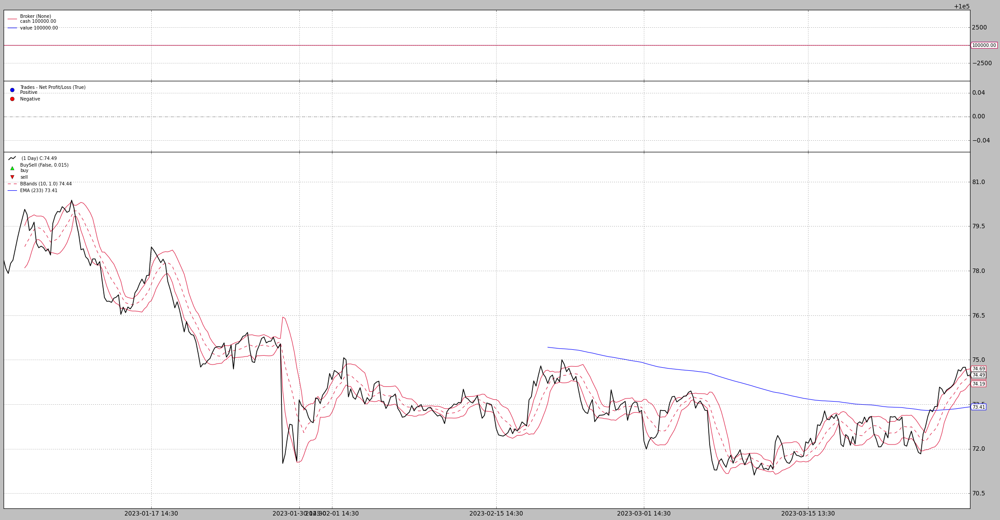

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,None,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
df = yf.download("CL",start="2023-01-01", end="2023-03-29", interval="1h")
backtest(BBandsStrategyEMA233, df, period=10, devfactor=1)


In [71]:
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy

class PriceAboveEMA2(BaseStrategy):
    """
    fast_period : int
        Fast period moving average
    slow_period : int
        Slow period moving average
    """

    params = (("slow_period", 233),)

    def __init__(self):

        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.slow_period = self.params.slow_period
        if self.strategy_logging:
            print("===Strategy level arguments===")

            print("slow_period :", self.slow_period)
        self.ema_slow = bt.ind.EMA(period=self.slow_period)

    def buy_signal(self):
        return  (self.dataclose > self.ema_slow)

    def sell_signal(self):
        return (self.dataclose < self.ema_slow)


In [72]:
df = yf.download("SPY", start="2005-01-01", end="2023-01-01")
res = backtest(PriceAboveEMA2, df, slow_period=range(1,250,1), verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
slow_period : 1
2022-12-30T00:00:00, Final Portfolio Value: 100000.0
2022-12-30T00:00:00, Final PnL: 0.0
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
slow_period : 2
2022-12-30T00:00:00, Final Portfolio Value: 82615.95579528809
2022-12-30T00:00:00, Final PnL:

In [73]:
print(res[['slow_period', 'win_rate', "final_value", "maxdrawdown","sharperatio", "total"]].head(30))

    slow_period  win_rate    final_value  maxdrawdown  sharperatio  total
0           124  0.252525  242235.472359    18.991054     0.365346     99
1           125  0.232323  240949.707596    20.945974     0.369401     99
2           122  0.257732  237505.309380    20.591100     0.359118     97
3           121  0.257732  236553.955788    20.603214     0.356662     97
4           123  0.255102  235416.150795    20.602512     0.353458     98
5           126  0.227723  233179.818359    20.802903     0.352734    101
6           220  0.245902  233098.419365    21.032527     0.361364     61
7           222  0.254237  232380.781532    21.024631     0.360633     59
8           221  0.250000  231283.570778    21.030510     0.358228     60
9           223  0.254237  230348.969749    21.028008     0.356090     59
10          120  0.257426  230269.950523    21.118905     0.341077    101
11          219  0.241935  229978.065468    21.029407     0.353176     62
12          224  0.250000  228969.9828

In [74]:
from __future__ import (
    absolute_import,
    division,
    print_function,
    unicode_literals,
)

# Import modules
import backtrader as bt

# Import from package
from fastquant.strategies.base import BaseStrategy

class WilliamsR(BaseStrategy):


    params = (("williams_period", 22),("williams_upper", -30), ("williams_lower", -90),)

    def __init__(self):

        # Initialize global variables
        super().__init__()
        # Strategy level variables
        self.williams_period = self.params.williams_period
        self.williams_upper = self.params.williams_upper
        self.williams_lower = self.params.williams_lower

        if self.strategy_logging:
            print("===Strategy level arguments===")
            print("williams_period :", self.williams_period)
            print("williams_upper :", self.williams_upper)
            print("williams_lower :", self.williams_lower)

        "self.williams2 = bt.ind.WilliamsR(period=self.williams_period) "
        self.williams = bt.indicators.WilliamsR(
            period=self.williams_period,
            upperband=self.williams_upper,
            lowerband=self.williams_lower,

        )


    def buy_signal(self):
        return (self.williams[0] < self.williams_lower)

    def sell_signal(self):
        return self.williams[0] > self.williams_upper



In [75]:
df = yf.download("KO", start="2005-01-01", end="2023-01-01")
res = backtest(WilliamsR, df,williams_period=range(4,6,2) ,williams_lower=range(-100,-50,5),williams_upper=range(-50,0,5), verbose=True, plot=False, single_position=True)

[*********************100%%**********************]  1 of 1 completed

Starting Portfolio Value: 100000.00


2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
williams_period : 4
williams_upper : -50
williams_lower : -100
2022-12-30T00:00:00, Final Portfolio Value: 100000.0
2022-12-30T00:00:00, Final PnL: 0.0
2022-12-30T00:00:00, ===Global level arguments===
2022-12-30T00:00:00, init_cash : 100000
2022-12-30T00:00:00, buy_prop : 1
2022-12-30T00:00:00, sell_prop : 1
2022-12-30T00:00:00, commission : 0
2022-12-30T00:00:00, stop_loss : 0
2022-12-30T00:00:00, stop_trail : 0
2022-12-30T00:00:00, take_profit : 0
2022-12-30T00:00:00, allow_short : False
===Strategy level arguments===
williams_period : 4
williams_upper : -45
williams_lower : -100
2022-12-30T00:00:00, Final Portfoli

In [76]:
print(res[['williams_period', 'williams_lower', "williams_upper", "final_value", "win_rate","sharperatio", "total", "maxdrawdown"]].head(30))

    williams_period  williams_lower  williams_upper    final_value  win_rate  \
0                 4             -55             -10  737057.253174  0.712230   
1                 4             -60             -35  697835.443890  0.701681   
2                 4             -55             -35  691380.607651  0.708911   
3                 4             -55             -40  686146.646782  0.707635   
4                 4             -65              -5  683277.781641  0.735450   
5                 4             -75             -40  676043.690136  0.711779   
6                 4             -60             -10  673884.827705  0.720149   
7                 4             -75             -35  670632.742201  0.705263   
8                 4             -75              -5  670404.846886  0.728814   
9                 4             -60             -40  663453.872700  0.702381   
10                4             -55             -30  660891.959003  0.710970   
11                4             -60     

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 100000.00
2023-03-28T00:00:00, ===Global level arguments===
2023-03-28T00:00:00, init_cash : 100000
2023-03-28T00:00:00, buy_prop : 1
2023-03-28T00:00:00, sell_prop : 1
2023-03-28T00:00:00, commission : 0
2023-03-28T00:00:00, stop_loss : 0
2023-03-28T00:00:00, stop_trail : 0
2023-03-28T00:00:00, take_profit : 0
2023-03-28T00:00:00, allow_short : False
===Strategy level arguments===
williams_period : 20
williams_upper : -30
williams_lower : -80
2023-03-28T00:00:00, Final Portfolio Value: 92075.93310546875
2023-03-28T00:00:00, Final PnL: -7924.07
Time used (seconds): 0.25285983085632324
Number of strat runs: 1
Number of strats per run: 1
Strat names: ['WilliamsR']
**************************************************
--------------------------------------------------
Strategy Parameters	init_cash:100000	buy_prop:1	sell_prop:1	fractional:False	slippage:0.001	single_position:None	commission:0	stop_loss:0	stop_trail:0	take_profit:0	execution_type:close	channel:	symbol

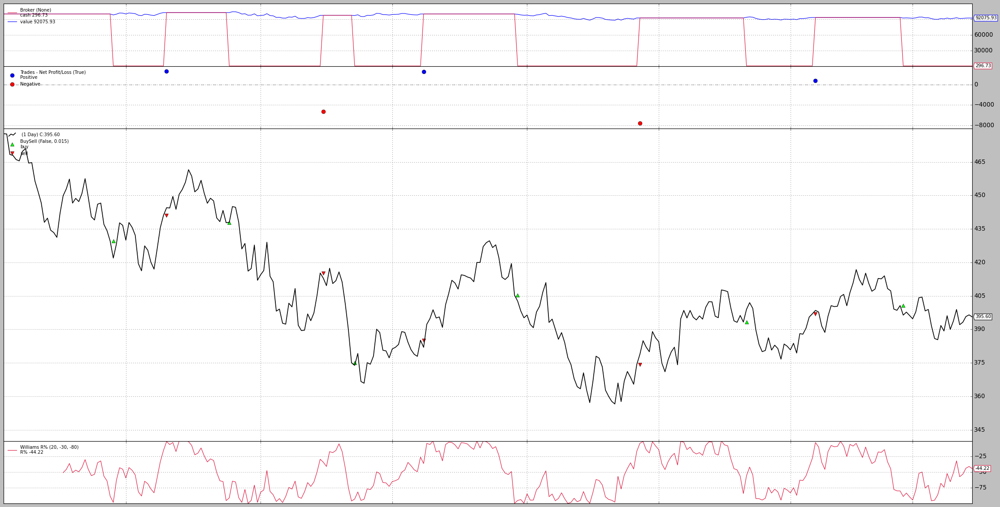

,strat_id,init_cash,buy_prop,sell_prop,fractional,slippage,single_position,commission,stop_loss,stop_trail,...,won,lost,won_avg,won_avg_prcnt,lost_avg,lost_avg_prcnt,won_max,won_max_prcnt,lost_max,lost_max_prcnt
0,0,100000,1,1,False,0.001,None,0,0,0,...,3,2,2050.92985,2.05093,-6451.468506,-6.451469,2668.0,2.668,-7630.917297,-7.630917


In [77]:
df = yf.download("SPY", start="2022-01-01", end="2023-03-29")
backtest(WilliamsR, df, williams_period=20, williams_lower=-80, williams_upper=-30)